# Predicting Transthyretin Activity Using Graph Convolutional and 3D Convolutional Neural Networks

## Introduction

The Tox24 Challenge is an advanced computational chemistry competition designed to evaluate the progress in methods for predicting the in vitro activity of chemical compounds. Building on the foundational Tox21 Challenge, the Tox24 Challenge aims to "crowdsource" innovative approaches from independent researchers to predict compounds' biochemical pathway interference using only chemical structure data.

This project is an effort to participate in the Tox24 Challenge by leveraging cutting-edge AI and biotechnology techniques.

## Objective

Our goal is to predict the activity of chemical compounds against Transthyretin (TTR) using their SMILES (Simplified Molecular Input Line Entry System) representations. We will employ a hybrid approach that integrates graph convolutional neural networks (GCNN) and 3D convolutional neural networks (3D-CNN) to achieve high predictive accuracy.

## Background

### Tox24 Challenge

The Tox24 Challenge focuses on predicting the activity of compounds using their structural information. The data includes:
- **Training Set:** 1012 compounds
- **Leaderboard Set:** 200 compounds
- **Blind Set:** 300 compounds

These compounds are tested for activity against Transthyretin (TTR) within the "Toxicology in the 21st Century" (Tox21) initiative by the Environmental Protection Agency (EPA). The structural information (SMILES) for these compounds is obtained from the U.S. EPA’s CompTox Chemicals Dashboard.

### Methodology

In this project, we leverage the electrostatic potential (ESP) surface generation technique introduced in the paper titled ["Practical High-Quality Electrostatic Potential Surfaces for Drug Discovery Using a Graph-Convolutional Deep Neural Network"](https://doi.org/10.1021/acs.jmedchem.9b01129) by Prakash Chandra Rathi, R. Frederick Ludlow, and Marcel L. Verdonk. The ESP-DNN model, described in their work, uses a graph convolutional neural network (GCNN) trained on electrostatic potential surfaces derived from high-quality quantum mechanics (QM) calculations.

We use this model to generate accurate ESP surfaces for the chemical compounds involved in our project. The surface meshes generated by the ESP-DNN model form the foundation for further voxelization, which allows us to input them into our custom 3D convolutional neural network (3D-CNN) for predicting compound activit

### Data Processing and Model Training

The steps involved in our methodology are as follows:

1. **Generating Electrostatic Potential Surfaces (ESP) using Graph-Convolutional DNN:**
   - Utilize the pretrained GCNN model to generate ESP surfaces for the given ligands quickly and accurately.

2. **Exporting and Voxelizing Surface Meshes:**
   - Export the generated ESP surfaces as surface meshes.
   - Voxelize these surface meshes, converting them into a 3D grid format suitable for 3D-CNN input.

3. **Training a 3D Convolutional Neural Network (3D-CNN):**
   - Train a 3D-CNN to predict the activity of compounds based on the voxelized ESP surfaces.
   - Validate and test the model using the provided leaderboard and blind test sets.



## Importing Necessary Packages


In [126]:
# General purpose
import os
import pickle
import h5py
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objects as go

# Machine learning and data processing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

# PyTorch for deep learning
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Utilities
from tqdm import tqdm
from prettytable import PrettyTable


## Data Preprocessing

In this section, we will preprocess the dataset by scaling the activity values using Min-Max scaling. This is an essential step to ensure that our model can learn effectively from the data.

### Load the Dataset

The dataset for the Tox24 Challenge includes training and test sets. We will focus on the training set for now. The data is stored in CSV format.

In [9]:
# Load the data
data_dir = 'data'
data = pd.read_csv(f'{data_dir}/tox24_challenge_train.csv')

## Scale and Save the Activity Values
We will scale the activity values using the MinMaxScaler from scikit-learn, save the scaler for future use, and add a new column to the dataset for the scaled activity values.

In [10]:
output_dir = "outputs/intermediate/"

# Initialize and fit the MinMaxScaler
min_max_scaler = MinMaxScaler()
data['activity_minmax'] = min_max_scaler.fit_transform(data[['activity']])

# Save the scaler
scaler_path = os.path.join(output_dir, 'min_max_scaler.pkl')
with open(scaler_path, 'wb') as f:
    pickle.dump(min_max_scaler, f)

# Save the processed data
processed_data_path = os.path.join(output_dir, 'processed_train_dataset.csv')
data.to_csv(processed_data_path, index=False)

print(f'Scaler saved to {scaler_path}')
print(f'Processed data saved to {processed_data_path}')


Scaler saved to outputs/intermediate/min_max_scaler.pkl
Processed data saved to outputs/intermediate/processed_train_dataset.csv


In [11]:
data.head()

,SMILES,activity,activity_minmax
0,CC1(C)[C@@H]2C[C@H]1C(=C)CC2,12.3,0.367072
1,COC(=O)C(C)OC1=CC=C(OC2=CC=C(Cl)C=C2Cl)C=C1,94.1,0.891095
2,CCCCCCCCCCCCCC(=O)OCC(O)CO,38.1,0.532351
3,CC(=O)O[C@@H]1C[C@@H]2CC[C@@]1(C)C2(C)C,11.8,0.363869
4,CCCCCCCCCC=CCC1CC(=O)OC1=O,98.4,0.918642


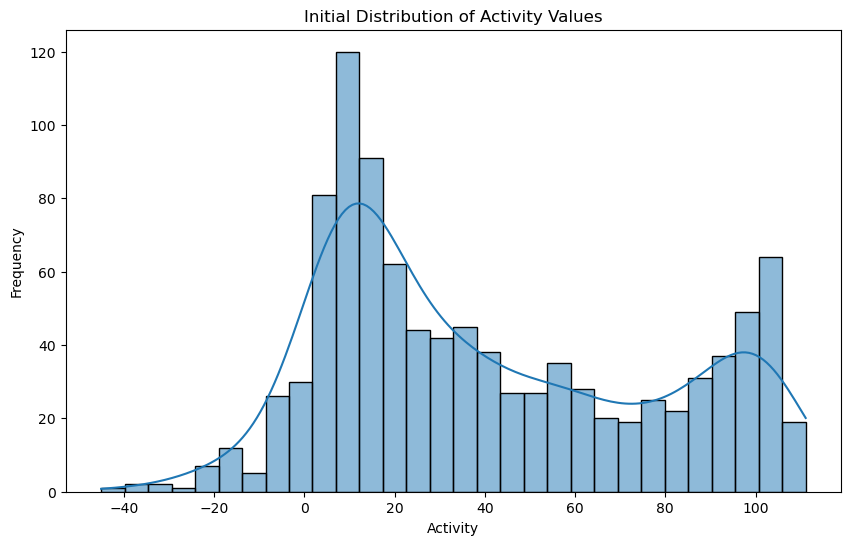

In [115]:
# Initial visualization of the activity distribution
plt.figure(figsize=(10, 6))
sns.histplot(data['activity'], kde=True, bins=30)
plt.title('Initial Distribution of Activity Values')
plt.xlabel('Activity')
plt.ylabel('Frequency')
plt.savefig('activity_distribution.png', dpi=300, bbox_inches='tight')
plt.show()


## Generating and Processing Electrostatic Potential Surfaces

In this section, we will describe the process of generating electrostatic potential (ESP) surfaces from SMILES representations of compounds. The ESP surfaces provide crucial insights into the electrostatic nature of molecules, which are essential for predicting their activity.

### Generating PDB Files from SMILES

The first step is to convert the SMILES representations into PDB (Protein Data Bank) format files. These PDB files are then used as inputs for the ESP-DNN model.


### Generating PQR Files Using ESP-DNN

Using the PDB files, we generated PQR files using the ESP-DNN model from the repository [ESP_DNN](https://github.com/AstexUK/ESP_DNN). The ESP-DNN model generates high-quality ESP surfaces for ligands, which are then converted into PQR format. All credits for this tool and the underlying methodology go to the authors of the paper:

**Practical High-Quality Electrostatic Potential Surfaces for Drug Discovery Using a Graph-Convolutional Deep Neural Network**
- **Authors:** Prakash Chandra Rathi, R. Frederick Ludlow, Marcel L. Verdonk
- **Journal:** Journal of Medicinal Chemistry
- **Publication Date:** August 27, 2020
- **DOI:** [10.1021/acs.jmedchem.9b01129](https://doi.org/10.1021/acs.jmedchem.9b01129)

### Exporting Surface Meshes

The PQR files were then processed using the tool from the repository [esp-surface-generator](https://github.com/AstexUK/esp-surface-generator) to export the surface meshes in TMESH format.


### Preprocessing and Alignment

After obtaining the TMESH files, we performed the following preprocessing steps:

1. **Alignment of Molecules:**
   We aligned each molecule using principal axes calculated from the atom coordinates. This step ensures that the molecules are consistently oriented, which is crucial for subsequent analysis.

````python
def calculate_principal_axes(atoms):
    center_of_mass = np.mean(atoms, axis=0)
    centered_atoms = atoms - center_of_mass
    inertia_tensor = np.dot(centered_atoms.T, centered_atoms)
    eigenvalues, eigenvectors = np.linalg.eigh(inertia_tensor)
    return eigenvectors, center_of_mass

def transform_vertices(vertices, eigenvectors, center_of_mass):
    transformed_positions = np.dot(vertices[:, :3] - center_of_mass, eigenvectors)
    transformed_vertices = np.hstack((transformed_positions, vertices[:, 3:]))  
    return transformed_vertices
````



2. **Extracting Relevant Data:**
    From the TMESH files, we extracted only the potential values and the XYZ coordinates of the vertices, discarding any other information.

3. **Scaling Potential Values:**
    The potential values were scaled using Min-Max scaling to ensure they fall within a consistent range, facilitating better model performance.

### Handling Incomplete Conversions

It is important to note that some SMILES strings did not convert properly to PDB files, and some PDB files did not convert correctly to PQR and TMesh formats. To maintain the quality and consistency of our dataset, we excluded these problematic files.




## Voxelizing Mesh Files

In this section, we will describe how to convert the processed mesh files into voxelized files, which are suitable for input into a 3D convolutional neural network (3D-CNN). We provide the voxelized dataset for convenience, but for those interested in the process, the following code can be used to generate the voxelized files from the TMESH files.

### Voxelization Process

The voxelization process involves converting the surface meshes into a 3D grid format. This process includes reading the TMESH files, creating voxel grids, and standardizing these grids to a fixed size. The voxelized data is then saved in HDF5 format for efficient storage and retrieval.

To manage memory usage effectively, we used a 64x64x64 grid size for the voxelized files.

#### Code for Voxelization
```python
import os
import numpy as np
import open3d as o3d
import matplotlib
import h5py
from tqdm import tqdm


def read_transformed_tmesh(filename):
    try:
        with open(filename, 'r') as file:
            n_vertices = int(file.readline().strip())
            vertices = []
            for i in range(n_vertices):
                line = file.readline().strip().split()
                x, y, z, u = map(float, line)
                vertices.append([x, y, z, u])

            n_triangles = int(file.readline().strip())
            triangles = []
            for i in range(n_triangles):
                header = file.readline().strip()
                indices = []
                for j in range(3):
                    indices.append(int(file.readline().strip()))
                triangles.append(indices)
        
        vertices = np.array(vertices)
        triangles = np.array(triangles)
        return vertices, triangles
    except Exception as e:
        print(f"Error reading tmesh file: {e}")
        raise



def create_colored_voxel_grid_from_mesh(vertices, triangles, voxel_size=0.1):
    # Extract XYZ coordinates and color values
    xyz = vertices[:, :3].astype(np.float64)  # Ensure vertices are float64
    colors = vertices[:, 3].astype(np.float64)  # Ensure colors are float64
    
    # Normalize the color values between 0 and 1 if necessary
    colors = (colors - colors.min()) / (colors.max() - colors.min())
    
    # Map the scalar colors to RGB using a colormap
    colormap = matplotlib.colormaps.get_cmap('viridis')
    rgb_colors = colormap(colors)[:, :3].astype(np.float64)  # Ensure colors are float64 and discard alpha

    # Ensure triangles are int32
    triangles = triangles.astype(np.int32)

    # Create the TriangleMesh
    mesh = o3d.geometry.TriangleMesh()
    mesh.vertices = o3d.utility.Vector3dVector(xyz)
    mesh.triangles = o3d.utility.Vector3iVector(triangles)
    mesh.vertex_colors = o3d.utility.Vector3dVector(rgb_colors)

    # Optionally, compute normals for better visualization
    mesh.compute_vertex_normals()

    # Convert the mesh to a point cloud
    pcd = mesh.sample_points_poisson_disk(number_of_points=100000)  # Adjust the number of points as needed

    # Convert the point cloud to a voxel grid
    voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(pcd, voxel_size)

    return voxel_grid

def standardize_voxel_grid(voxel_grid, fixed_grid_size=64):
    # Extract voxel coordinates and colors (if available)
    voxels = voxel_grid.get_voxels()
    voxel_coords = np.array([voxel.grid_index for voxel in voxels])
    voxel_colors = np.array([voxel.color for voxel in voxels]) if voxels[0].color is not None else None

    # Compute bounding box of the original voxel grid
    min_coords = voxel_coords.min(axis=0)
    max_coords = voxel_coords.max(axis=0)
    bbox_size = max_coords - min_coords

    # Compute scaling factor to fit into fixed grid size
    scale = (fixed_grid_size - 1) / bbox_size.max()
    scaled_coords = (voxel_coords - min_coords) * scale

    # Center the scaled coordinates within the fixed grid size
    offset = (fixed_grid_size - 1 - scaled_coords.max(axis=0)) / 2
    standardized_coords = np.round(scaled_coords + offset).astype(int)

    # Create an occupancy grid
    occupancy_grid = np.zeros((fixed_grid_size, fixed_grid_size, fixed_grid_size), dtype=np.uint8)
    occupancy_grid[tuple(standardized_coords.T)] = 1

    color_grid = None
    if voxel_colors is not None:
        color_grid = np.zeros((fixed_grid_size, fixed_grid_size, fixed_grid_size, 3), dtype=np.float32)
        color_grid[tuple(standardized_coords.T)] = voxel_colors

    return occupancy_grid, color_grid

def save_voxel_data(filename, occupancy_grid, color_grid=None):
    with h5py.File(filename, 'w') as f:
        f.create_dataset('occupancy', data=occupancy_grid, compression='gzip')
        if color_grid is not None:
            f.create_dataset('color', data=color_grid, compression='gzip')

def process_directory(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    for filename in tqdm(os.listdir(input_dir), desc=f"Processing {input_dir}"):
        if filename.endswith('.tmesh'):
            input_filepath = os.path.join(input_dir, filename)
            output_filepath = os.path.join(output_dir, filename.replace('.tmesh', '.h5'))
            vertices, triangles = read_transformed_tmesh(input_filepath)
            voxel_grid = create_colored_voxel_grid_from_mesh(vertices, triangles, voxel_size=0.1)
            fixed_grid_size = 64
            occupancy_grid, color_grid = standardize_voxel_grid(voxel_grid, fixed_grid_size)
            save_voxel_data(output_filepath, occupancy_grid, color_grid)
            tqdm.write(f"Processed {input_filepath} and saved to {output_filepath}")


# Directories
train_dir = "train_transformed_surfaces"
test_dir = "test_transformed_surfaces"
train_output_dir = 'train_h5'
test_output_dir = 'test_h5'

# Process directories
process_directory(train_dir, train_output_dir)
process_directory(test_dir, test_output_dir)

```

### Voxelized Dataset
For convenience, we provide the voxelized dataset as part of this project. This dataset includes voxelized representations of the processed mesh files, which are ready for use in training a 3D-CNN model.

## Visualizing Voxelized Data

To better understand the structure and content of the voxelized data, we will visualize one of the voxelized files. This helps in verifying the correctness of the voxelization process and gaining insights into the spatial distribution of the data.

### Code for Visualization

We use `h5py` to load the voxelized data and `plotly` to create a 3D visualization. The code below demonstrates how to visualize a single voxelized file.


In [91]:
def load_voxel_data(filename):
    with h5py.File(filename, 'r') as f:
        occupancy_grid = f['occupancy'][:]
        color_grid = f.get('color')[:]
    return occupancy_grid, color_grid

def visualize_voxel_data(occupancy_grid, color_grid=None, save_image=False, image_filename='voxel_plot.png'):
    # Get the coordinates of the occupied voxels
    occupied_coords = np.argwhere(occupancy_grid)

    # Initialize the lists for the vertices and the colors
    x, y, z = [], [], []
    i, j, k = [], [], []
    vertex_colors = []

    # Create voxel vertices
    for idx, (xi, yi, zi) in enumerate(occupied_coords):
        # Create vertices for the voxel
        voxel_vertices = [
            [xi, yi, zi],
            [xi+1, yi, zi],
            [xi+1, yi+1, zi],
            [xi, yi+1, zi],
            [xi, yi, zi+1],
            [xi+1, yi, zi+1],
            [xi+1, yi+1, zi+1],
            [xi, yi+1, zi+1]
        ]
        x.extend([v[0] for v in voxel_vertices])
        y.extend([v[1] for v in voxel_vertices])
        z.extend([v[2] for v in voxel_vertices])
        
        # Define the 12 triangles composing the voxel (two per face)
        base_idx = idx * 8
        voxel_faces = [
            [0, 1, 2], [0, 2, 3],  # bottom
            [4, 5, 6], [4, 6, 7],  # top
            [0, 1, 5], [0, 5, 4],  # front
            [2, 3, 7], [2, 7, 6],  # back
            [1, 2, 6], [1, 6, 5],  # right
            [0, 3, 7], [0, 7, 4]   # left
        ]
        for face in voxel_faces:
            i.append(base_idx + face[0])
            j.append(base_idx + face[1])
            k.append(base_idx + face[2])
        
        # Append the color for each face if color grid is available
        if color_grid is not None:
            color = color_grid[xi, yi, zi]
            vertex_colors.extend([color for _ in range(12)])

    if color_grid is not None:
        # Convert the colors to the format 'rgb(r,g,b)'
        face_colors = ['rgb({},{},{})'.format(r, g, b) for r, g, b in vertex_colors]
    else:
        face_colors = 'rgb(0, 0, 0)'

    fig = go.Figure(data=[go.Mesh3d(
        x=x,
        y=y,
        z=z,
        i=i,
        j=j,
        k=k,
        facecolor=face_colors,
        opacity=1
    )])

    # Set the camera view to look straight at the voxel grid
    camera = dict(
        eye=dict(x=0.1, y=2, z=0.4)  # Adjust these values to control the view angle
    )
    
    fig.update_layout(scene=dict(aspectmode='data', camera=camera))
    fig.show()

    # Save the figure as a 2D image if save_image is True
    if save_image:
        
        fig.write_image(image_filename,scale=1, width=1920, height=1080)


In [92]:
init_notebook_mode(connected=True)
occupancy_grid, color_grid = load_voxel_data("data/voxel_data/train/molecule_499.h5")
visualize_voxel_data(occupancy_grid, color_grid)

## Preparing the DataLoader and Data Splitting

To train our 3D convolutional neural network (3D-CNN) on the voxelized data, we need to define a `Dataset` class, apply transformations, and split the data into training and validation sets. Below, we outline the steps and provide the necessary code.

### Defining 3D Transformations

We define two transformations for data augmentation: random flipping and random rotation of the 3D voxel data. These transformations help to increase the diversity of the training data and improve the model's generalization.


In [93]:
# Define 3D transformations
class RandomFlip3D:
    def __call__(self, voxel_data):
        if np.random.rand() > 0.5:
            voxel_data = voxel_data.flip(dims=[1])  # Horizontal flip
        if np.random.rand() > 0.5:
            voxel_data = voxel_data.flip(dims=[2])  # Vertical flip
        if np.random.rand() > 0.5:
            voxel_data = voxel_data.flip(dims=[3])  # Depth flip
        return voxel_data

class RandomRotate3D:
    def __call__(self, voxel_data):
        k = np.random.randint(0, 4)
        voxel_data = voxel_data.rot90(k, dims=[1, 2])  # Rotate along height and width
        return voxel_data

train_transform = [RandomFlip3D(), RandomRotate3D()]
val_transform = []  # No transformation for validation set

# Helper function to apply transformations
def apply_transforms(voxel_data, transforms):
    for transform in transforms:
        voxel_data = transform(voxel_data)
    return voxel_data

### Defining the Dataset Class
The `Tox24VoxelDataset` class inherits from `torch.utils.data.Dataset`. It handles loading the voxelized data and applying the transformations.

In [94]:
class Tox24VoxelDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        
        
        # Filter out invalid entries
        self.valid_indices = []
        for idx in range(len(self.annotations)):
            voxel_file = os.path.join(self.root_dir, f'molecule_{idx}.h5')
            if os.path.exists(voxel_file):
                self.valid_indices.append(idx)

    def __len__(self):
        return len(self.valid_indices)

    def __getitem__(self, idx):
        valid_idx = self.valid_indices[idx]
        activity = self.annotations.iloc[valid_idx, 2]
        
        # Load voxel data
        voxel_file = os.path.join(self.root_dir, f'molecule_{valid_idx}.h5')
        voxel_data = self.load_voxel_data(voxel_file)
        
        if self.transform:
            voxel_data = apply_transforms(voxel_data, self.transform)
        
        return voxel_data, torch.tensor(activity, dtype=torch.float32), valid_idx

    def load_voxel_data(self, filename):
        with h5py.File(filename, 'r') as f:
            color_grid = f['color'][:]
        color_grid = color_grid.transpose(3, 0, 1, 2)  # Transpose to (channels, depth, height, width)
        color_grid = color_grid.astype(np.float32)

        # Create a mask for non-white voxels (assuming white is [255, 255, 255])
        mask = np.any(color_grid < 1, axis=0, keepdims=True).astype(np.float32)
        masked_color_grid = color_grid * mask  # Apply mask

        voxel_data = torch.tensor(masked_color_grid, dtype=torch.float32)
        return voxel_data

### Splitting the Data
We split the dataset into training and validation sets using `train_test_split` from `sklearn.model_selection`. We then create `DataLoader` objects for each set.

In [95]:
csv_file = 'outputs/intermediate/processed_train_dataset.csv'
root_dir = 'data/voxel_data/train'

# Load full dataset
full_dataset = Tox24VoxelDataset(csv_file=csv_file, root_dir=root_dir)

# Split dataset into training and validation sets
train_indices, val_indices = train_test_split(list(range(len(full_dataset))), test_size=0.1, random_state=42)

train_dataset = Subset(Tox24VoxelDataset(csv_file=csv_file, root_dir=root_dir, transform=train_transform), train_indices)
val_dataset = Subset(Tox24VoxelDataset(csv_file=csv_file, root_dir=root_dir, transform=val_transform), val_indices)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)


## 3D Convolutional Neural Network (3D-CNN) Architecture

In this section, we describe the architecture of our 3D convolutional neural network (3D-CNN) model, which is designed to predict the activity of compounds based on voxelized electrostatic potential surfaces.

### Model Architecture

The `VoxelNet` class defines the architecture of our 3D-CNN. The model consists of several 3D convolutional layers followed by max-pooling layers, batch normalization, and fully connected layers.


In [96]:
class VoxelNet(nn.Module):
    def __init__(self):
        super(VoxelNet, self).__init__()

        # Conv Block 1
        self.conv1 = nn.Conv3d(in_channels=3, out_channels=64, kernel_size=3, padding=1)  # Output: (64, 64, 64, 64)
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2)  # Output: (64, 32, 32, 32)
        self.bn1 = nn.BatchNorm3d(64)
        
        # Conv Block 2
        self.conv2 = nn.Conv3d(in_channels=64, out_channels=64, kernel_size=3, padding=1)  # Output: (64, 32, 32, 32)
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2)  # Output: (64, 16, 16, 16)
        self.bn2 = nn.BatchNorm3d(64)
        
        # Conv Block 3
        self.conv3 = nn.Conv3d(in_channels=64, out_channels=128, kernel_size=3, padding=1)  # Output: (128, 16, 16, 16)
        self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2)  # Output: (128, 8, 8, 8)
        self.bn3 = nn.BatchNorm3d(128)
        
        # Conv Block 4
        self.conv4 = nn.Conv3d(in_channels=128, out_channels=256, kernel_size=3, padding=1)  # Output: (256, 8, 8, 8)
        self.pool4 = nn.MaxPool3d(kernel_size=2, stride=2)  # Output: (256, 4, 4, 4)
        self.bn4 = nn.BatchNorm3d(256)
        
        # Global Average Pooling
        self.global_avg_pool = nn.AdaptiveAvgPool3d(1)  # Output: (256, 1, 1, 1)
        
        # Fully Connected Layers
        self.fc1 = nn.Linear(256, 512)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(512, 1)
        
    def forward(self, x):
        # Conv Block 1
        x = F.relu(self.conv1(x))
        x = self.pool1(x)
        x = self.bn1(x)
        
        # Conv Block 2
        x = F.relu(self.conv2(x))
        x = self.pool2(x)
        x = self.bn2(x)
        
        # Conv Block 3
        x = F.relu(self.conv3(x))
        x = self.pool3(x)
        x = self.bn3(x)
        
        # Conv Block 4
        x = F.relu(self.conv4(x))
        x = self.pool4(x)
        x = self.bn4(x)
        
        # Global Average Pooling
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)  # Flatten to (batch_size, 256)
        
        # Fully Connected Layers
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc2(x))  # Sigmoid activation for output between 0 and 1
        
        return x


## Loading the Scaler and Normalizing Data

In this section, we load the previously saved MinMaxScaler and define a custom PyTorch-compatible scaler for normalizing the activity values during training and evaluation.

### Loading the MinMaxScaler

We start by loading the MinMaxScaler that was saved earlier during the data preprocessing step. This scaler will be used to normalize and denormalize the activity values.


In [97]:
class TorchMinMaxScaler:
    def __init__(self, min_val, max_val, clip_min=None, clip_max=None):
        self.min_val, self.max_val = float(min_val), float(max_val)
        self.clip_min, self.clip_max = clip_min, clip_max

    def transform(self, x):
        return (x - self.min_val) / (self.max_val - self.min_val)

    def inverse_transform(self, x):
        x = np.array(x) * (self.max_val - self.min_val) + self.min_val
        if self.clip_min is not None and self.clip_max is not None:
            x = np.clip(x, self.clip_min, self.clip_max)
        return x

In [98]:
# Load MinMaxScaler
minmax_scaler_path = scaler_path
with open(minmax_scaler_path, 'rb') as f:
    minmax_scaler = pickle.load(f)

min_val, max_val = minmax_scaler.data_min_[0], minmax_scaler.data_max_[0]
clip_min, clip_max = -100, 150

activity_minmax_scaler = TorchMinMaxScaler(min_val, max_val, clip_min, clip_max)


## Training and Validation Functions

In this section, we define the `train` and `validate` functions that will be used to train and evaluate our 3D convolutional neural network (3D-CNN). These functions handle the forward pass, loss computation, backpropagation, and performance metrics calculation.


### RMSE Calculation
The `rmse` function calculates the Root Mean Squared Error between the true and predicted values.



In [103]:
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

### Training Function

The `train` function performs one epoch of training. It iterates over the training data, computes the loss, performs backpropagation, and updates the model parameters.

In [104]:
def train(model, device, train_loader, criterion, optimizer, scaler):
    model.train()
    running_loss = 0.0
    all_outputs = []
    all_expected = []
    
    for data in tqdm(train_loader, desc="Training", disable=False):
        voxel_data, activity, _ = data
        voxel_data, activity = voxel_data.to(device), activity.to(device)

        optimizer.zero_grad()
        outputs = model(voxel_data)
        loss = criterion(outputs.squeeze(), activity)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item() * voxel_data.size(0)
        
        all_outputs.extend(outputs.squeeze().detach().cpu().numpy())
        all_expected.extend(activity.cpu().numpy())

    epoch_loss = running_loss / len(train_loader.dataset)
    
    # Compute RMSE
    all_outputs = scaler.inverse_transform(all_outputs)
    all_expected = scaler.inverse_transform(all_expected)
    train_rmse = rmse(all_expected, all_outputs)
    
    return epoch_loss, train_rmse


### Validation Function
The `validate` function evaluates the model on the validation data. It computes the loss and RMSE (Root Mean Squared Error). If the `show_outputs` flag is set to `True`, it also prints the expected and predicted outputs in a tabular format.

In [105]:
def validate(model, device, val_loader, criterion, scaler, show_outputs=False):
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_expected = []
    
    with torch.no_grad():
        for data in tqdm(val_loader, desc="Validating",disable=False):
            voxel_data, activity, _ = data
            voxel_data, activity = voxel_data.to(device), activity.to(device)

            outputs = model(voxel_data)
            loss = criterion(outputs.squeeze(), activity)

            running_loss += loss.item() * voxel_data.size(0)
            
            all_outputs.extend(outputs.squeeze().cpu().numpy())
            all_expected.extend(activity.cpu().numpy())

    epoch_loss = running_loss / len(val_loader.dataset)
    
    # Compute RMSE
    all_outputs = scaler.inverse_transform(all_outputs)
    all_expected = scaler.inverse_transform(all_expected)
    val_rmse = rmse(all_expected, all_outputs)
    
    if show_outputs:
        table = PrettyTable()
        table.field_names = ["Expected Output", "Predicted Output"]
        for expected, predicted in zip(all_expected, all_outputs):
            table.add_row([expected, predicted])
        print(table)
    
    return epoch_loss, val_rmse

## Training Script

In this section, we provide the complete training script for our 3D convolutional neural network (3D-CNN). This script includes the initialization of the device, model, criterion, optimizer, and learning rate scheduler. It also contains the training loop with early stopping based on validation loss.

### Complete Training Script

In [102]:
# Initialize device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [107]:
# Initialize model, criterion, optimizer, and scheduler
model = VoxelNet().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

# Directories for saving models
save_dir = 'outputs/checkpoints'
os.makedirs(save_dir, exist_ok=True)
best_model_path = os.path.join(save_dir, 'best_model.pth')

# Training parameters
num_epochs = 100
best_val_loss = float('inf')
patience = 10
epochs_without_improvement = 0

# Lists to store losses and RMSEs for plotting
train_losses = []
train_rmses = []
val_losses = []
val_rmses = []

for epoch in range(num_epochs):
    # Training step
    train_loss, train_rmse = train(model, device, train_loader, criterion, optimizer, activity_minmax_scaler)
    # Validation step
    val_loss, val_rmse = validate(model, device, val_loader, criterion, activity_minmax_scaler, show_outputs=False)

    # Adjust learning rate based on validation loss
    scheduler.step(val_loss)

    # Record losses and RMSEs
    train_losses.append(train_loss)
    train_rmses.append(train_rmse)
    val_losses.append(val_loss)
    val_rmses.append(val_rmse)

    print(f'Epoch {epoch+1}/{num_epochs}, \nTrain Loss: {train_loss:.4f}, Train RMSE: {train_rmse:.4f},\nVal Loss: {val_loss:.4f}, Val RMSE: {val_rmse:.4f}')

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f'Saved Best Model with Val Loss: {best_val_loss:.4f}')
        epochs_without_improvement = 0  # Reset counter
    else:
        epochs_without_improvement += 1

    # Check early stopping condition
    if epochs_without_improvement >= patience:
        print(f'Early stopping triggered after {epoch+1} epochs')
        break

print('Training complete')


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.90s/it]


Epoch 1/100, 
Train Loss: 0.0497, Train RMSE: 34.7849,
Val Loss: 0.0732, Val RMSE: 42.2231
Saved Best Model with Val Loss: 0.0732


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.53s/it]


Epoch 2/100, 
Train Loss: 0.0447, Train RMSE: 32.9952,
Val Loss: 0.0861, Val RMSE: 45.7970


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.92s/it]


Epoch 3/100, 
Train Loss: 0.0478, Train RMSE: 34.1119,
Val Loss: 0.1139, Val RMSE: 52.6834


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]


Epoch 4/100, 
Train Loss: 0.0443, Train RMSE: 32.8472,
Val Loss: 0.1354, Val RMSE: 57.4350


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.51s/it]


Epoch 5/100, 
Train Loss: 0.0446, Train RMSE: 32.9593,
Val Loss: 0.0483, Val RMSE: 34.3168
Saved Best Model with Val Loss: 0.0483


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.67s/it]


Epoch 6/100, 
Train Loss: 0.0419, Train RMSE: 31.9489,
Val Loss: 0.0415, Val RMSE: 31.8075
Saved Best Model with Val Loss: 0.0415


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.52s/it]


Epoch 7/100, 
Train Loss: 0.0406, Train RMSE: 31.4516,
Val Loss: 0.0435, Val RMSE: 32.5406


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.72s/it]


Epoch 8/100, 
Train Loss: 0.0398, Train RMSE: 31.1246,
Val Loss: 0.0467, Val RMSE: 33.7492


Validating: 100%|██████████| 2/2 [00:02<00:00,  1.47s/it]


Epoch 9/100, 
Train Loss: 0.0391, Train RMSE: 30.8762,
Val Loss: 0.0568, Val RMSE: 37.2187


Validating: 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]


Epoch 10/100, 
Train Loss: 0.0385, Train RMSE: 30.6285,
Val Loss: 0.0486, Val RMSE: 34.3959


Validating: 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]


Epoch 11/100, 
Train Loss: 0.0386, Train RMSE: 30.6693,
Val Loss: 0.0422, Val RMSE: 32.0640


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]


Epoch 12/100, 
Train Loss: 0.0376, Train RMSE: 30.2786,
Val Loss: 0.0440, Val RMSE: 32.7269


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.54s/it]


Epoch 13/100, 
Train Loss: 0.0351, Train RMSE: 29.2584,
Val Loss: 0.0419, Val RMSE: 31.9650


Validating: 100%|██████████| 2/2 [00:02<00:00,  1.46s/it]


Epoch 14/100, 
Train Loss: 0.0354, Train RMSE: 29.3543,
Val Loss: 0.0417, Val RMSE: 31.8857


Validating: 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]


Epoch 15/100, 
Train Loss: 0.0349, Train RMSE: 29.1493,
Val Loss: 0.0420, Val RMSE: 31.9874


Validating: 100%|██████████| 2/2 [00:03<00:00,  1.51s/it]

Epoch 16/100, 
Train Loss: 0.0351, Train RMSE: 29.2635,
Val Loss: 0.0417, Val RMSE: 31.8710
Early stopping triggered after 16 epochs
Training complete


### Plotting Training and Validation Loss over Epochs

To assess how well the model learned during training, we plot the training and validation loss over each epoch.

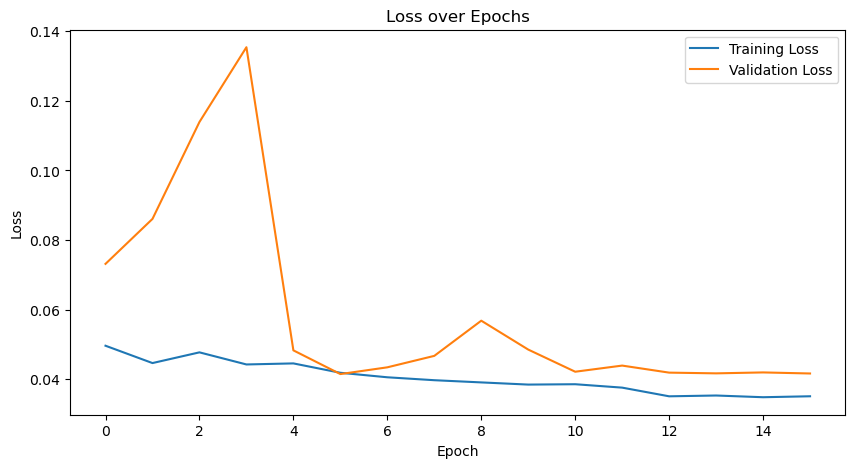

In [113]:
# Plot training and validation loss over epochs
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
#plt.savefig('loss_over_epochs.png', dpi=300, bbox_inches='tight')
plt.show()

### Evaluating the Model on the Validation Set

After training, we load the best model and evaluate it on the validation set to obtain predictions and compare them with actual values.

In [124]:
# Load the best model
model.load_state_dict(torch.load(best_model_path))
model.to(device)

# Function to evaluate the model on the validation set and collect outputs
def evaluate(model, device, data_loader, scaler):
    model.eval()
    all_outputs = []
    all_targets = []
    with torch.no_grad():
        for data in data_loader:
            voxel_data, activity, _ = data
            voxel_data, activity = voxel_data.to(device), activity.to(device)
            outputs = model(voxel_data)
            all_outputs.extend(outputs.squeeze().cpu().numpy())
            all_targets.extend(activity.cpu().numpy())

    # Inverse transform the outputs and targets
    all_outputs = scaler.inverse_transform(all_outputs)
    all_targets = scaler.inverse_transform(all_targets)
    return all_targets, all_outputs

# Evaluate the model on the validation set
actual_values, predicted_values = evaluate(model, device, val_loader, activity_minmax_scaler)


/tmp/ipykernel_1389978/4281083432.py:2: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



### Plotting Actual vs. Predicted Activity Values

We create a scatter plot to visualize the relationship between the actual and predicted activity values. Additionally, we include error magnitude, a perfect prediction line, and a regression line to enhance the analysis.

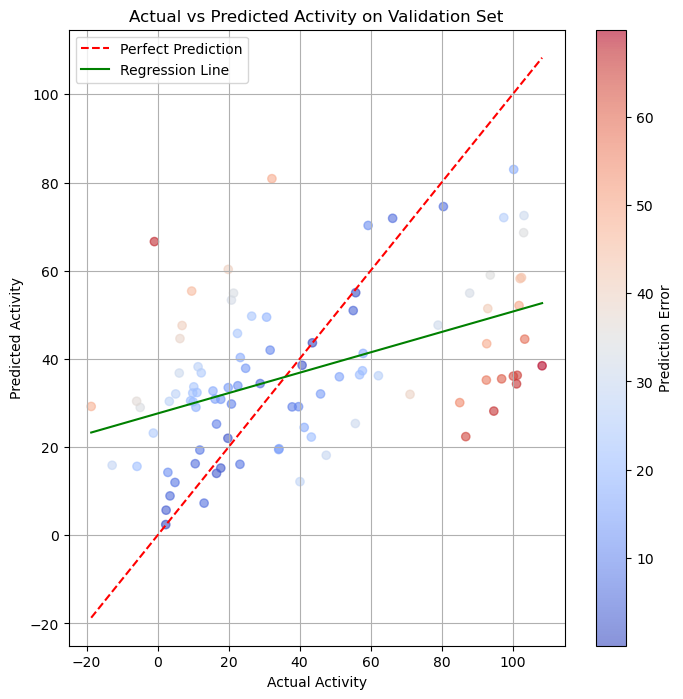

In [114]:
# Create a scatter plot with a color gradient based on error magnitude
plt.figure(figsize=(8, 8))
errors = np.abs(predicted_values - actual_values)
scatter = plt.scatter(actual_values, predicted_values, c=errors, cmap='coolwarm', alpha=0.6)

# Plot the y=x line (perfect predictions)
plt.plot([min(actual_values), max(actual_values)], [min(actual_values), max(actual_values)], 'r--', label='Perfect Prediction')

# Fit and plot a linear regression line for predicted vs actual values
model = LinearRegression()
model.fit(actual_values.reshape(-1, 1), predicted_values)
regression_line = model.predict(np.array([min(actual_values), max(actual_values)]).reshape(-1, 1))
plt.plot([min(actual_values), max(actual_values)], regression_line, 'g-', label='Regression Line')

# Adding color bar for error magnitude
cbar = plt.colorbar(scatter)
cbar.set_label('Prediction Error')

# Labels, title, and legend
plt.xlabel('Actual Activity')
plt.ylabel('Predicted Activity')
plt.title('Actual vs Predicted Activity on Validation Set')
plt.legend()
plt.grid(True)
#plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()


## Reflection

This project provided valuable insights into applying deep learning techniques to a challenging problem in computational chemistry. I learned about the importance of data preprocessing, handling small datasets, and the complexities of 3D data representation. Despite the hurdles, this experience has highlighted areas for growth and future exploration.

---

